# Roc Curves
Author(s): Haoyang Li

In [59]:
from pathlib import Path
from datetime import datetime

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import mplhep as hep
from matplotlib import colors

from boostedhh import utils, hh_vars, plotting
from boostedhh.utils import PAD_VAL
from bbtautau.postprocessing import Samples, postprocessing
from bbtautau.postprocessing.Samples import CHANNELS, SAMPLES, SIGNALS, BGS
import bbtautau.postprocessing.utils as putils

from bbtautau.HLTs import HLTs

import logging
import vector

logging.basicConfig(level=logging.INFO, format="%(asctime)s - %(levelname)s - %(message)s")
logger = logging.getLogger("boostedhh.utils")
logger.setLevel(logging.DEBUG)

In [2]:
# automatically reloads imported files on edits
%load_ext autoreload
%autoreload 2

In [3]:
MAIN_DIR = Path("../../../")
channel = "hh"  # options: "hh", "he", "hm"
CHANNEL = CHANNELS[channel]

year = "2022"

date = datetime.today().strftime("%B%d")

plot_dir = MAIN_DIR / f"plots/ControlPlots/{date}/{year}/{CHANNEL.key}"
plot_dir.mkdir(parents=True, exist_ok=True)

base_dir = Path("/ceph/cms/store/user/rkansal/bbtautau/skimmer/")
data_paths = {
    "signal": base_dir / "25Apr17bbpresel_v12_private_signal",
    "data": base_dir / "25Apr17bbpresel_v12_private_signal",
    "bg": base_dir / "25Apr17bbpresel_v12_private_signal",
}

sigs_all = {s + CHANNEL.key: SAMPLES[s + CHANNEL.key] for s in SIGNALS}
bgs_all = {bkey: b for bkey, b in SAMPLES.items() if b.get_type() == "bg"}

In [4]:
sigs_all

{'bbtthh': Sample(isData=False, isSignal=True, label='ggF HHbb$\\tau_h\\tau_h$', selector=None, load_columns=None, variations=None, weight_shifts=None, apply_jmsr=False, apply_jecs=False),
 'vbfbbtthh': Sample(isData=False, isSignal=True, label='VBF HHbb$\\tau_h\\tau_h$ (SM)', selector=None, load_columns=None, variations=None, weight_shifts=None, apply_jmsr=False, apply_jecs=False),
 'vbfbbtt-k2v0hh': Sample(isData=False, isSignal=True, label='VBF HHbb$\\tau_h\\tau_h$ ($\\kappa_{2V}=0$)', selector=None, load_columns=None, variations=None, weight_shifts=None, apply_jmsr=False, apply_jecs=False)}

In [5]:
# only plot ROC Curves for those signals
sigs = {}
sigs[f"bbtt{channel}"] = sigs_all[f"bbtt{channel}"]
sigs[f"vbfbbtt-k2v0{channel}"] = sigs_all[f"vbfbbtt-k2v0{channel}"]

In [6]:
bgs_all

{'qcd': Sample(isData=False, isSignal=False, label='QCD Multijet', selector=re.compile('^QCD'), load_columns=None, variations=None, weight_shifts=None, apply_jmsr=False, apply_jecs=False),
 'ttbarhad': Sample(isData=False, isSignal=False, label='TT Had', selector=re.compile('^TTto4Q'), load_columns=None, variations=None, weight_shifts=None, apply_jmsr=False, apply_jecs=False),
 'ttbarsl': Sample(isData=False, isSignal=False, label='TT SL', selector=re.compile('^TTtoLNu2Q'), load_columns=None, variations=None, weight_shifts=None, apply_jmsr=False, apply_jecs=False),
 'ttbarll': Sample(isData=False, isSignal=False, label='TT LL', selector=re.compile('^TTto2L2Nu'), load_columns=None, variations=None, weight_shifts=None, apply_jmsr=False, apply_jecs=False),
 'dyjets': Sample(isData=False, isSignal=False, label='DY+Jets', selector=re.compile('^DYto2L'), load_columns=None, variations=None, weight_shifts=None, apply_jmsr=False, apply_jecs=False),
 'wjets': Sample(isData=False, isSignal=False,

In [7]:
# only plot ROC Curves against those bgs

In [8]:
bgs = {}
bgs["qcd"] = bgs_all["qcd"]
bgs["ttbarhad"] = bgs_all["ttbarhad"]
bgs["ttbarsl"] = bgs_all["ttbarsl"]
bgs["ttbarll"] = bgs_all["ttbarll"]
bgs["dyjets"] = bgs_all["dyjets"]

## Load samples

In [9]:
# dictionary that will contain all information (from all samples)
# filters_dic = postprocessing.trigger_filter(
#     HLTs.hlts_list_by_dtype(year), fast_mode=False
# )  # = {"data": [(...)], "signal": [(...)], ...}

events_dict = postprocessing.load_samples(
    year,
    CHANNEL,
    data_paths,
    # filters_dic=filters_dic,
    load_data=True,
    load_bgs=True,  # , filters_dict=postprocessing.bb_filters(num_fatjets=3)
)
cutflow = pd.DataFrame(index=list(events_dict.keys()))

utils.add_to_cutflow(events_dict, "Preselection", "finalWeight", cutflow)
cutflow

/home/users/haoyang/bbtautau_LPC/src/bbtautau/postprocessing/postprocessing.py:262: UserWarning: Deprecation warning: Should switch to using the LoadedSample class in the future, by setting loaded_samples=True!
  warnings.warn(
2025-05-23 10:30:38,192 - INFO - Loading ['JetHT_Run2022C', 'JetMET_Run2022D', 'JetMET_Run2022C']
2025-05-23 10:30:38,194 - DEBUG - Loading JetHT_Run2022C
2025-05-23 10:30:57,297 - INFO - Loaded JetHT_Run2022C                                    : 518016 entries
2025-05-23 10:30:57,300 - DEBUG - Loading JetMET_Run2022D
2025-05-23 10:31:32,484 - INFO - Loaded JetMET_Run2022D                                   : 2724864 entries
2025-05-23 10:31:32,488 - DEBUG - Loading JetMET_Run2022C
2025-05-23 10:32:34,086 - INFO - Loaded JetMET_Run2022C                                   : 4630957 entries
2025-05-23 10:32:36,501 - INFO - Loading ['Tau_Run2022C', 'Tau_Run2022D']
2025-05-23 10:32:36,504 - DEBUG - Loading Tau_Run2022C
2025-05-23 10:33:02,616 - INFO - Loaded Tau_Run20

,Preselection
jetmet,7.873837e+06
tau,2.307660e+05
qcd,8.545631e+06
ttbarhad,7.779839e+04
ttbarsl,9.555963e+04
ttbarll,2.659896e+04
dyjets,6.689192e+03
wjets,5.329380e+04
zjets,5.970190e+04
hbb,2.140340e+03


Triggers

In [10]:
postprocessing.apply_triggers(events_dict, year, CHANNEL)
utils.add_to_cutflow(events_dict, "Triggers", "finalWeight", cutflow)
cutflow

/home/users/haoyang/bbtautau_LPC/src/bbtautau/postprocessing/postprocessing.py:465: UserWarning: Deprecation warning: Should switch to using the LoadedSample class in the future!
  warnings.warn(


,Preselection,Triggers
jetmet,7.873837e+06,4.872071e+06
tau,2.307660e+05,1.021650e+05
qcd,8.545631e+06,3.464459e+06
ttbarhad,7.779839e+04,6.674717e+04
ttbarsl,9.555963e+04,7.828290e+04
ttbarll,2.659896e+04,1.993933e+04
dyjets,6.689192e+03,3.136966e+03
wjets,5.329380e+04,2.834668e+04
zjets,5.970190e+04,4.105199e+04
hbb,2.140340e+03,1.659538e+03


bbtautau assignment

In [11]:
bbtt_masks = postprocessing.bbtautau_assignment(events_dict, CHANNEL)

/home/users/haoyang/bbtautau_LPC/src/bbtautau/postprocessing/postprocessing.py:543: UserWarning: Deprecation warning: Should switch to using the LoadedSample class in the future!
  warnings.warn(


jetmet
tau
qcd
ttbarhad
ttbarsl
ttbarll
dyjets
wjets
zjets
hbb
bbtthh
vbfbbtthh
vbfbbtt-k2v0hh


## Manually calculate PNet Xbb vs QCD score if not saved

In [12]:
Xbb_dict = {}
QCD_dict = {}
for key in events_dict.keys():
    Xbb_dict[key] = events_dict[key]["ak8FatJetPNetXbbLegacy"]
    QCD_dict[key] = events_dict[key]["ak8FatJetPNetQCDLegacy"]

Padded fat jets have a placeholding value for those scores. See an example below

In [13]:
print(Xbb_dict["jetmet"].min())
print(QCD_dict["jetmet"].min())

0    1.809317e-15
1   -9.999900e+04
2   -9.999900e+04
dtype: float64
0        0.000006
1   -99999.000000
2   -99999.000000
dtype: float64


First, calculate the Xbb vs QCD discrimator


Then, select those padded AK8 jets and set their discrimator to -99999 as well

In [14]:
for key in events_dict.keys():
    Xbb = Xbb_dict[key]
    QCD = QCD_dict[key]
    Xbb_vs_QCD = Xbb / (Xbb + QCD)
    for i in range(3):
        events_dict[key][f"ak8FatJetPNetXbbvsQCDLegacy{i}"] = Xbb_vs_QCD.loc[:, i]

In [15]:
padded_jet_mask = {}
for key in events_dict.keys():
    padded_jet_mask[key] = events_dict[key]["ak8FatJetPNetXbbLegacy"] < 0

In [16]:
for key in events_dict.keys():
    for i in range(3):
        masked_indices = padded_jet_mask[key].loc[:, i]
        events_dict[key].loc[masked_indices, f"ak8FatJetPNetXbbvsQCDLegacy{i}"] = -99999

## Make some control plots for cross checking

[ShapeVar(var='bbFatJetPt', label='$p_T^{bb}$ [GeV]', bins=[20, 250, 1250], reg=True, blind_window=None, significance_dir='right', plot_args=None, isVariation=False), ShapeVar(var='ttFatJetPt', label='$p_T^{\\tau\\tau}$ [GeV]', bins=[20, 250, 1250], reg=True, blind_window=None, significance_dir='right', plot_args=None, isVariation=False), ShapeVar(var='bbFatJetMass', label='$m^{bb}$ [GeV]', bins=[20, 250, 1250], reg=True, blind_window=None, significance_dir='right', plot_args=None, isVariation=False), ShapeVar(var='ttFatJetMass', label='$m^{\\tau\\tau}$ [GeV]', bins=[20, 250, 1250], reg=True, blind_window=None, significance_dir='right', plot_args=None, isVariation=False), ShapeVar(var='METPt', label='$p^{miss}_T$ [GeV]', bins=[20, 0, 300], reg=True, blind_window=None, significance_dir='right', plot_args=None, isVariation=False), ShapeVar(var='ak8FatJetPt0', label='$p_T^{j1}$ [GeV]', bins=[20, 250, 1250], reg=True, blind_window=None, significance_dir='right', plot_args=None, isVariation

/home/users/haoyang/bbtautau_LPC/src/bbtautau/postprocessing/utils.py:172: UserWarning: Deprecation warning: Should switch to using the LoadedSample class in the future!
  warnings.warn(


{'bbFatJetPt': Hist(
  StrCategory(['jetmet', 'tau', 'qcd', 'ttbarhad', 'ttbarsl', 'ttbarll', 'dyjets', 'wjets', 'zjets', 'hbb', 'bbtthh', 'vbfbbtthh', 'vbfbbtt-k2v0hh', 'data'], name='Sample'),
  Regular(20, 250, 1250, name='bbFatJetPt', label='$p_T^{bb}$ [GeV]'),
  storage=Weight()) # Sum: WeightedSum(value=8.87455e+06, variance=3.5713e+08) (WeightedSum(value=1.36521e+07, variance=5.38599e+08) with flow), 'ttFatJetPt': Hist(
  StrCategory(['jetmet', 'tau', 'qcd', 'ttbarhad', 'ttbarsl', 'ttbarll', 'dyjets', 'wjets', 'zjets', 'hbb', 'bbtthh', 'vbfbbtthh', 'vbfbbtt-k2v0hh', 'data'], name='Sample'),
  Regular(20, 250, 1250, name='ttFatJetPt', label='$p_T^{\\tau\\tau}$ [GeV]'),
  storage=Weight()) # Sum: WeightedSum(value=9.89876e+06, variance=4.87072e+08) (WeightedSum(value=1.36521e+07, variance=5.38599e+08) with flow), 'bbFatJetMass': Hist(
  StrCategory(['jetmet', 'tau', 'qcd', 'ttbarhad', 'ttbarsl', 'ttbarll', 'dyjets', 'wjets', 'zjets', 'hbb', 'bbtthh', 'vbfbbtthh', 'vbfbbtt-k2v0hh',

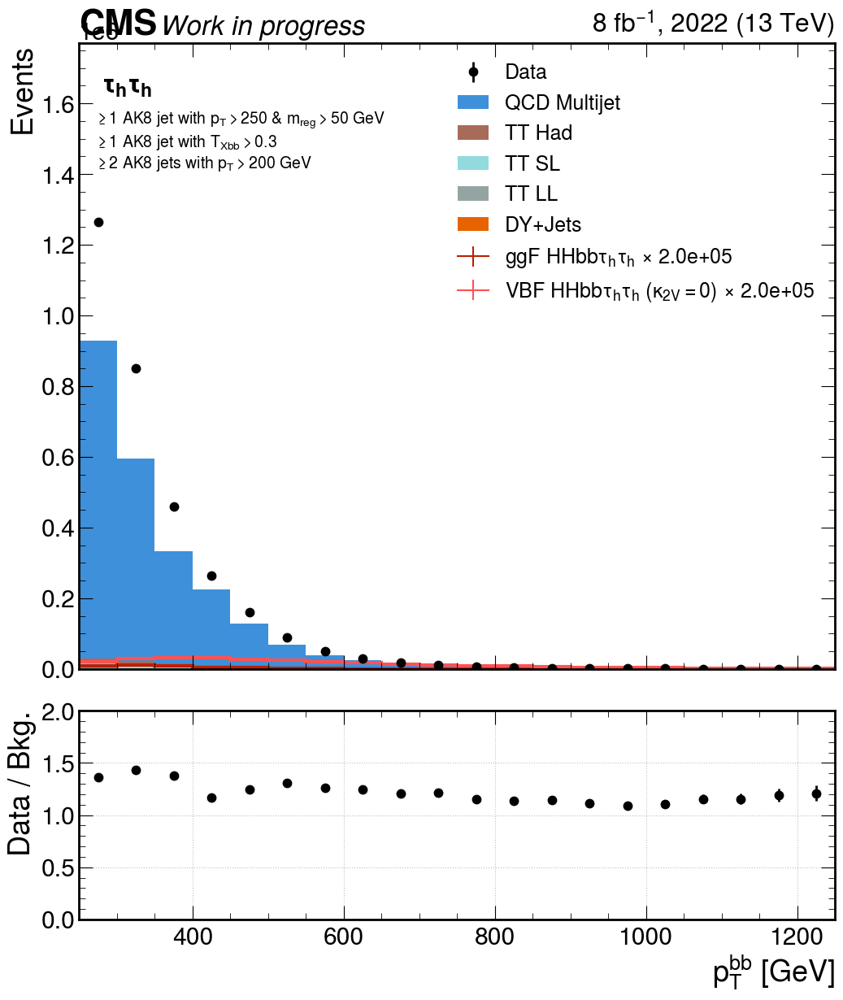

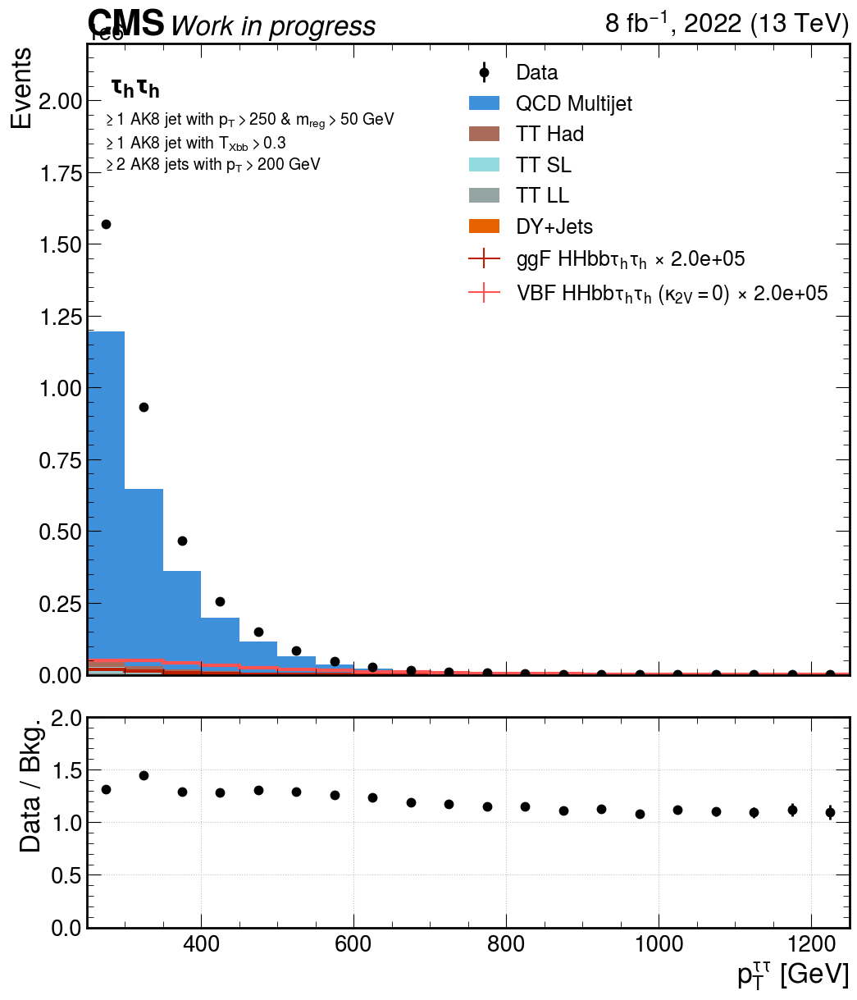

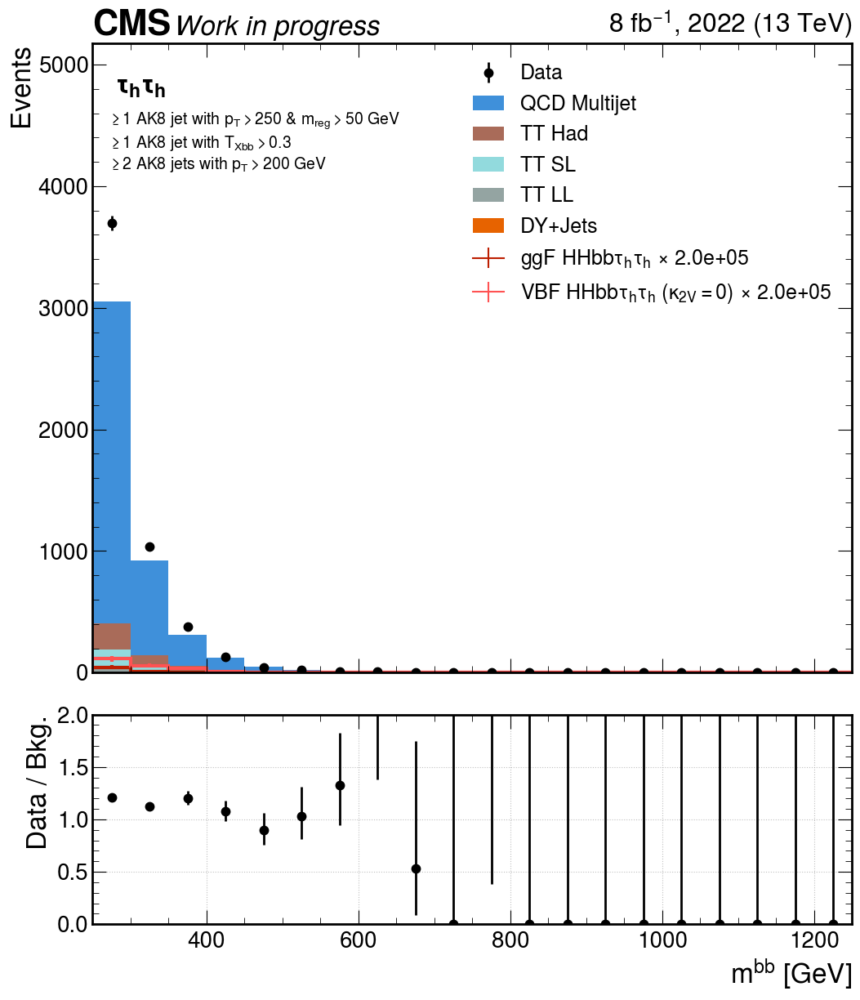

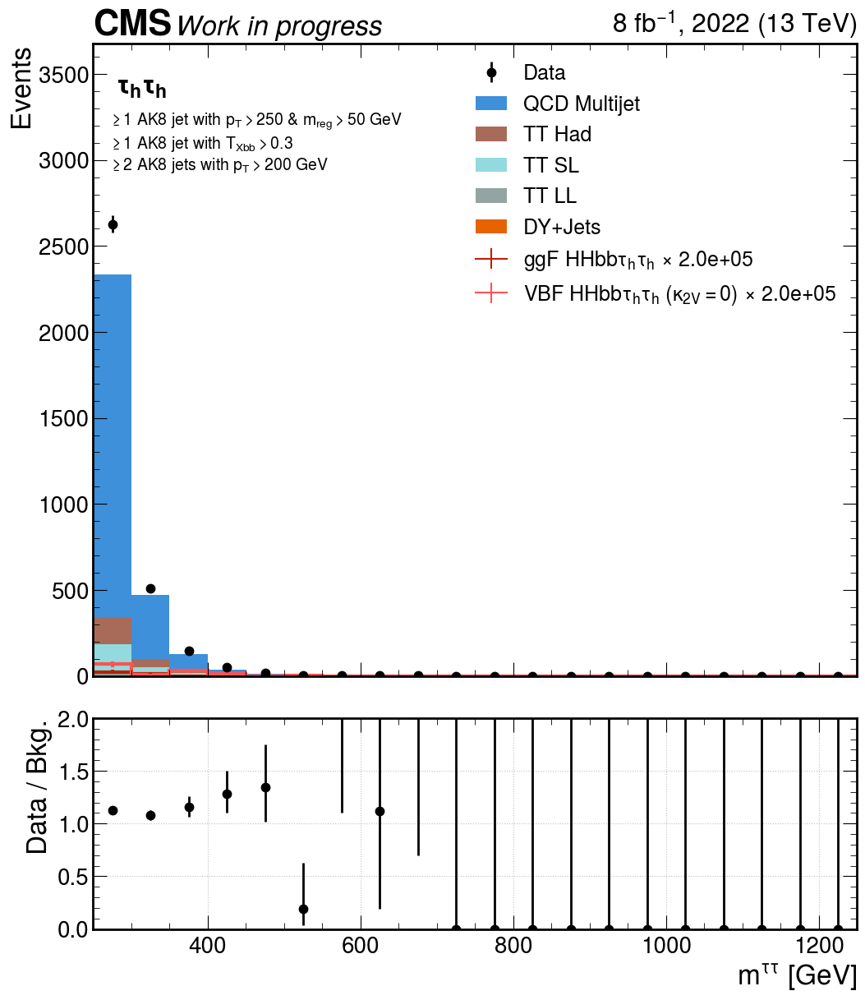

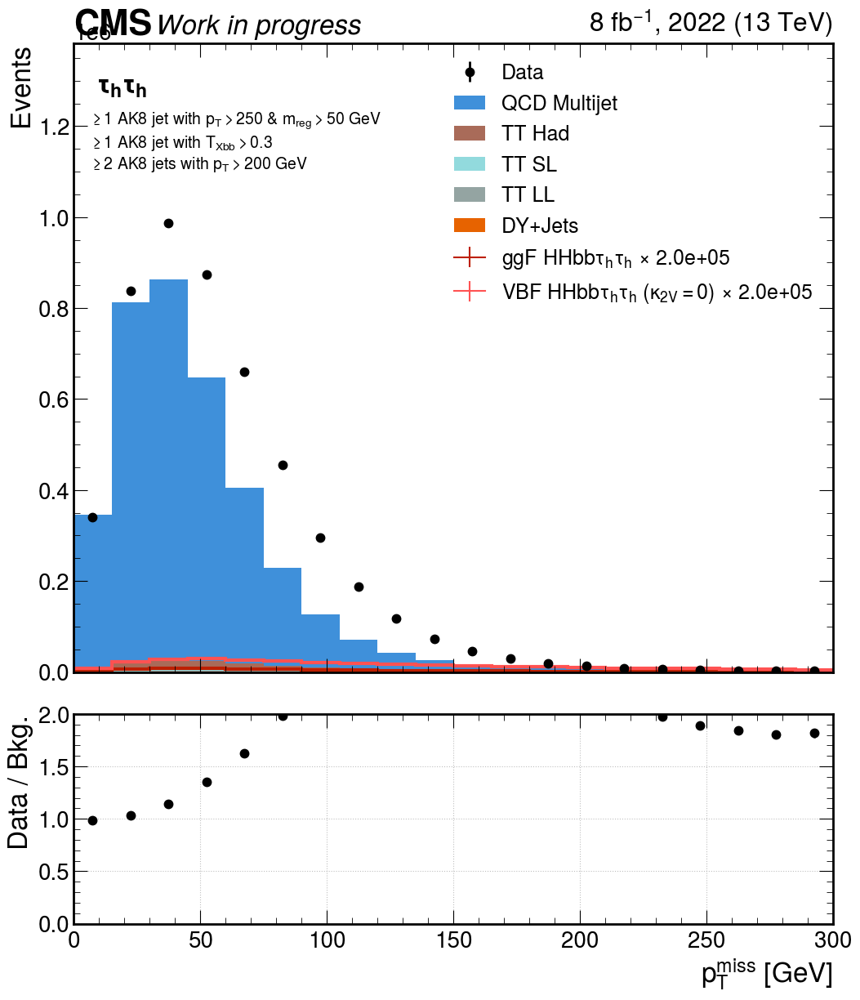

...

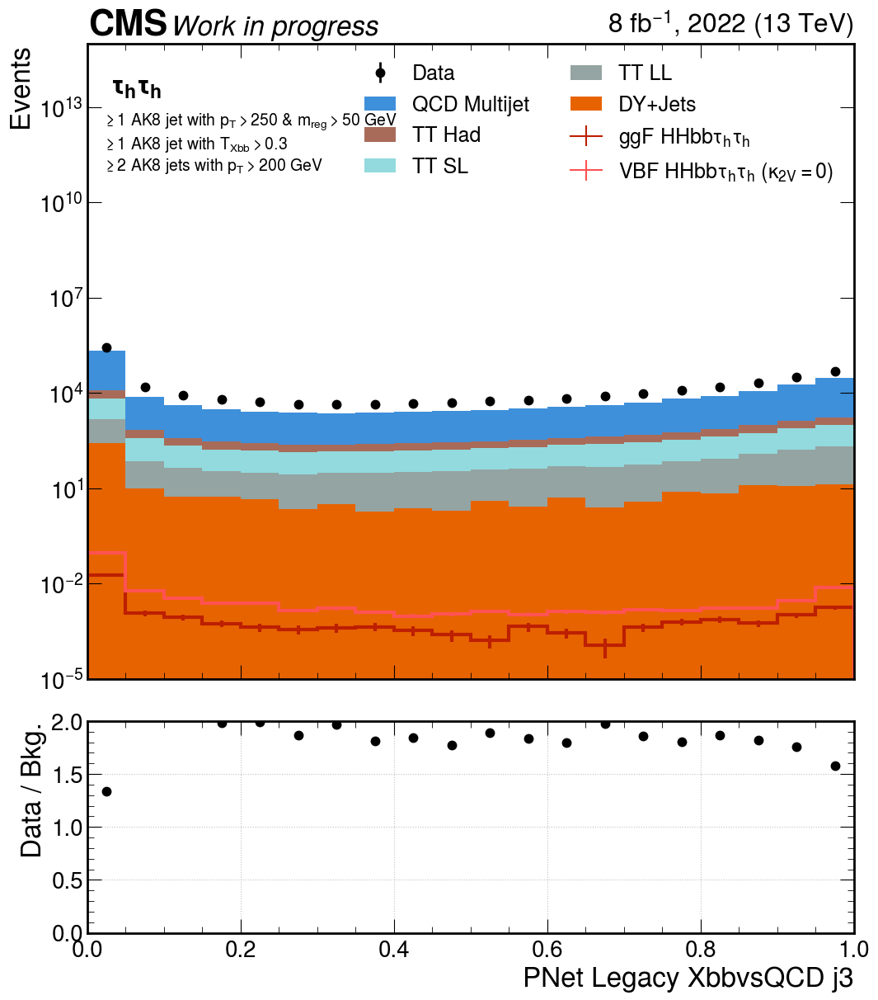

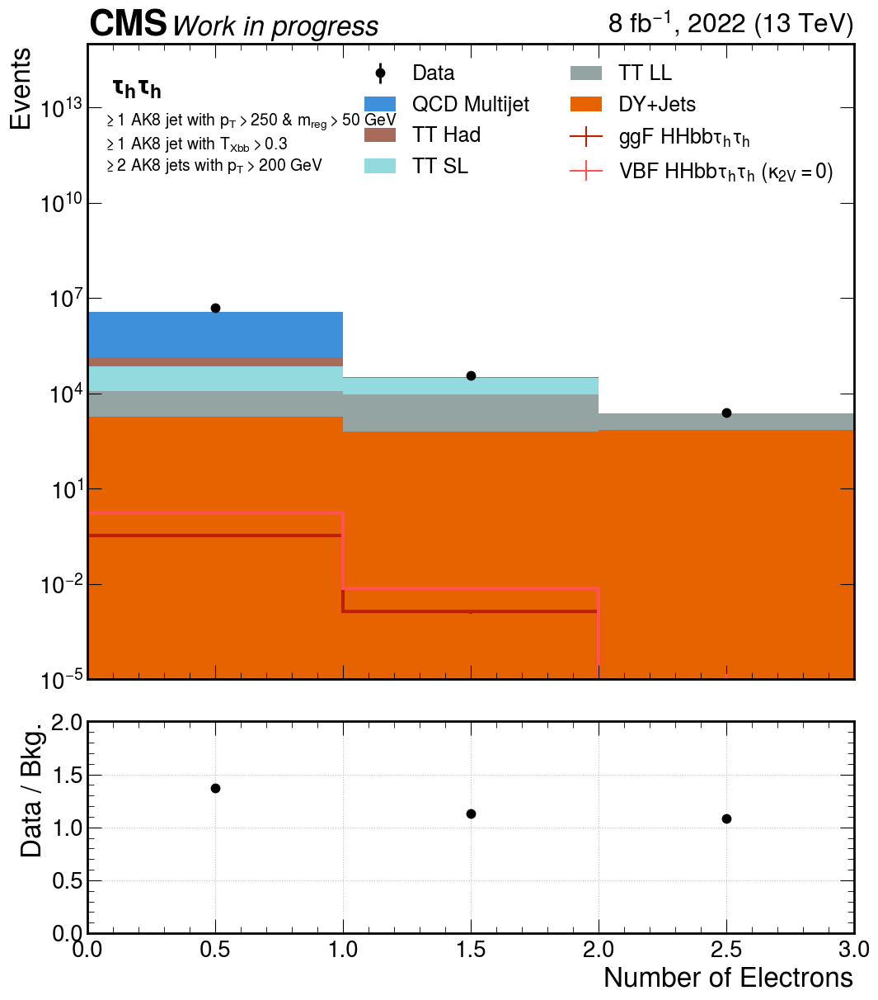

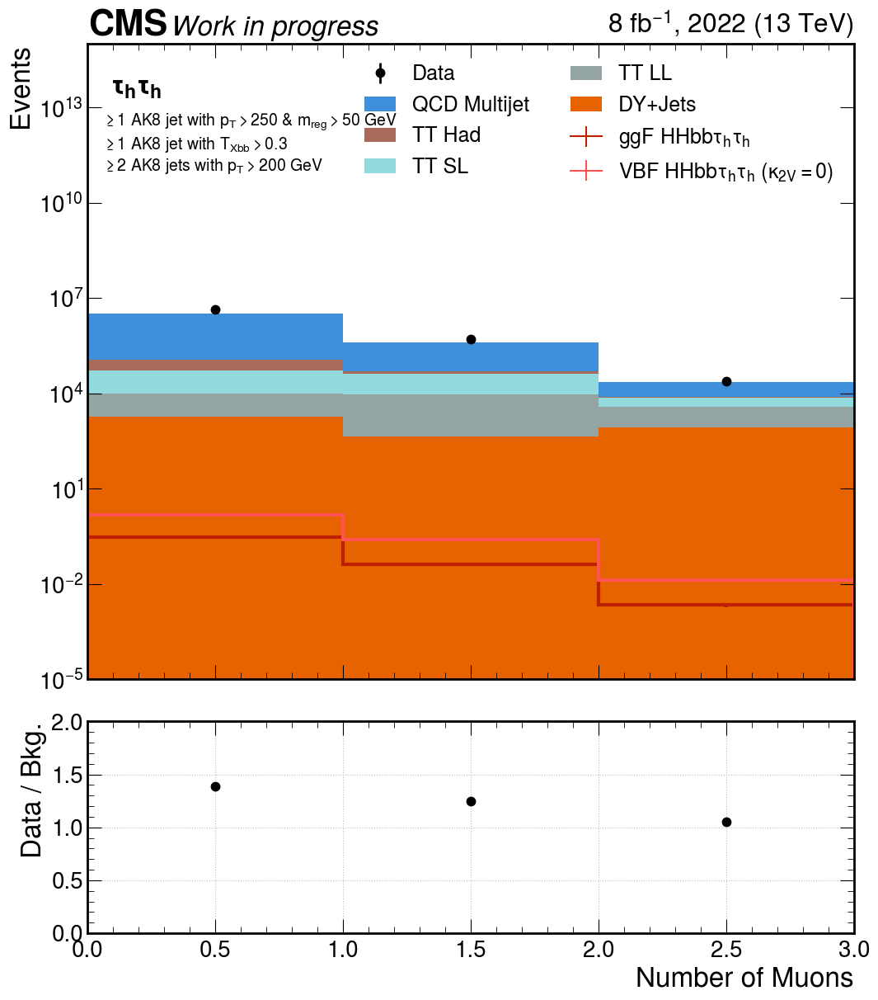

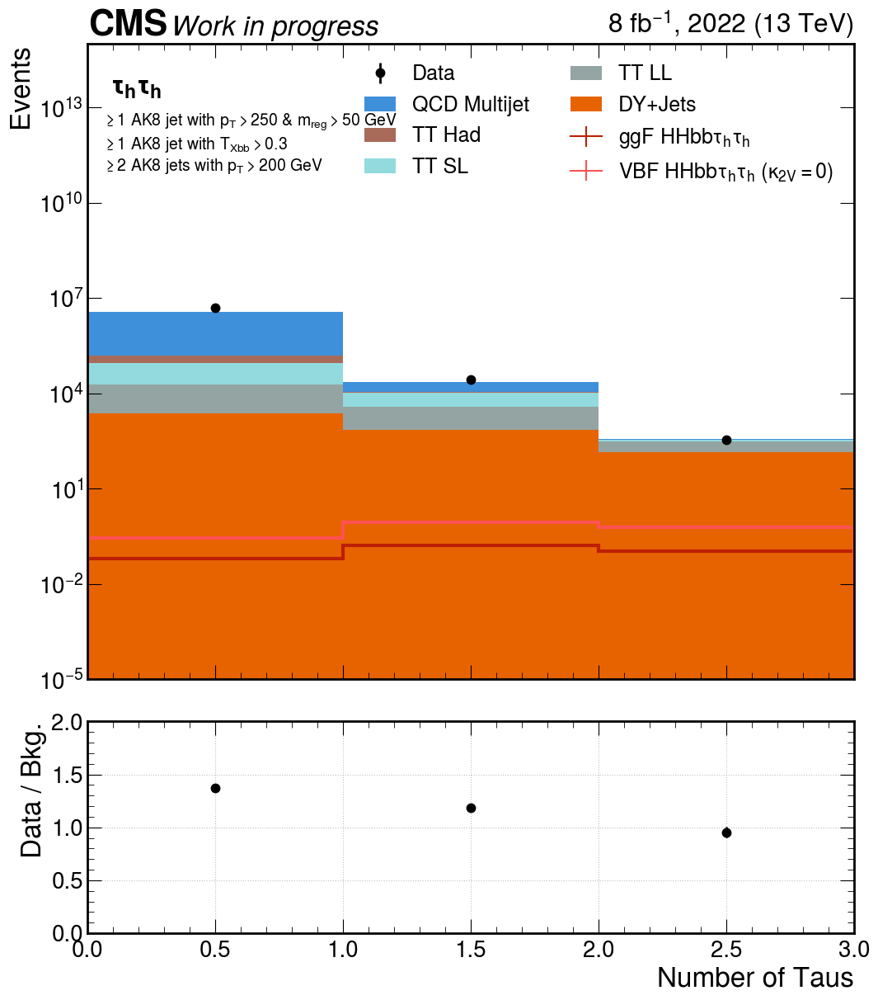

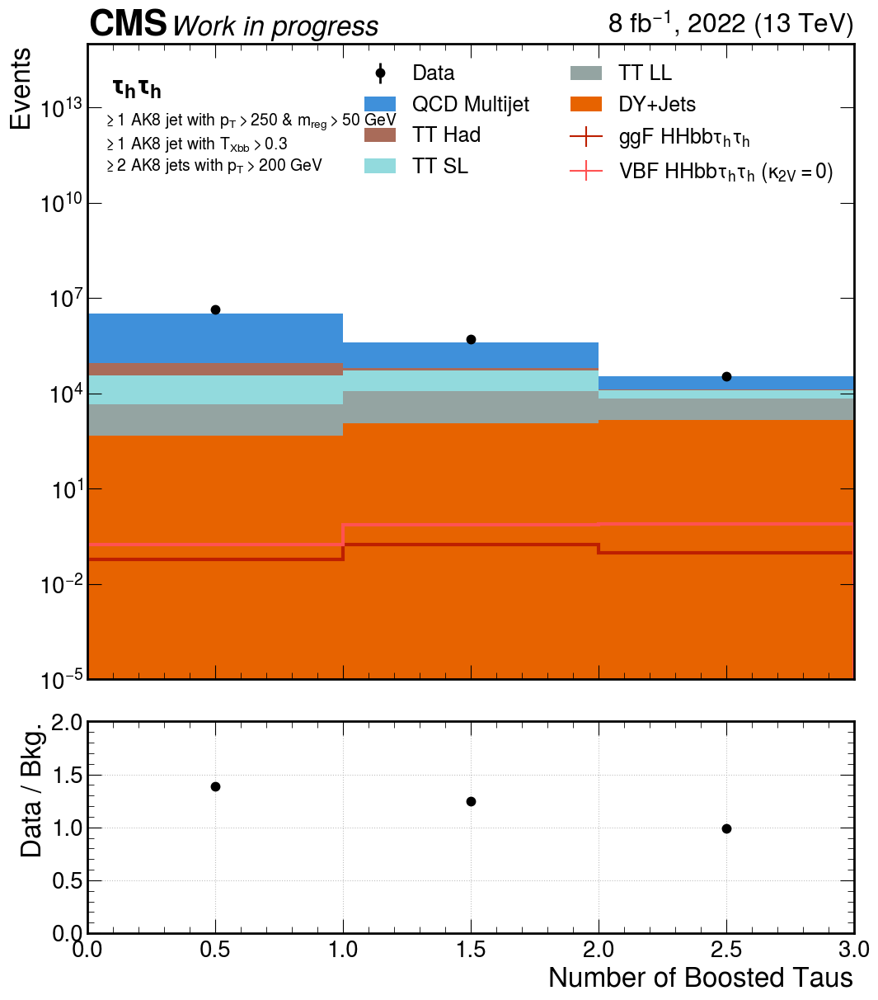

{'bbFatJetPt': Hist(
   StrCategory(['jetmet', 'tau', 'qcd', 'ttbarhad', 'ttbarsl', 'ttbarll', 'dyjets', 'wjets', 'zjets', 'hbb', 'bbtthh', 'vbfbbtthh', 'vbfbbtt-k2v0hh', 'data'], name='Sample'),
   Regular(20, 250, 1250, name='bbFatJetPt', label='$p_T^{bb}$ [GeV]'),
   storage=Weight()) # Sum: WeightedSum(value=8.87455e+06, variance=3.5713e+08) (WeightedSum(value=1.36521e+07, variance=5.38599e+08) with flow),
 'ttFatJetPt': Hist(
   StrCategory(['jetmet', 'tau', 'qcd', 'ttbarhad', 'ttbarsl', 'ttbarll', 'dyjets', 'wjets', 'zjets', 'hbb', 'bbtthh', 'vbfbbtthh', 'vbfbbtt-k2v0hh', 'data'], name='Sample'),
   Regular(20, 250, 1250, name='ttFatJetPt', label='$p_T^{\\tau\\tau}$ [GeV]'),
   storage=Weight()) # Sum: WeightedSum(value=9.89876e+06, variance=4.87072e+08) (WeightedSum(value=1.36521e+07, variance=5.38599e+08) with flow),
 'bbFatJetMass': Hist(
   StrCategory(['jetmet', 'tau', 'qcd', 'ttbarhad', 'ttbarsl', 'ttbarll', 'dyjets', 'wjets', 'zjets', 'hbb', 'bbtthh', 'vbfbbtthh', 'vbfbbtt

In [17]:
cutlabel = (
    r"$\geq 1$ AK8 jet with $p_T > 250$ & $m_{reg} > 50$ GeV"
    "\n"
    r"$\geq 1$ AK8 jet with $T_{Xbb} > 0.3$"
    "\n"
    r"$\geq 2$ AK8 jets with $p_T > 200$ GeV"
)

postprocessing.control_plots(
    events_dict,
    CHANNEL,
    sigs,
    bgs,
    postprocessing.control_plot_vars,
    plot_dir,
    year,
    bbtt_masks=bbtt_masks,
    cutlabel=cutlabel,
    plot_significance=False,
    show=True,
)

In [18]:
print(plot_dir)

../../../plots/ControlPlots/May23/2022/hh


## Calculate and Collect Discriminator Scores

## Make Roc Curves

In [19]:
taggers_dict = {}
taukey = {"hh": "Xtauhtauh", "he": "Xtauhtaue", "hm": "Xtauhtaum"}[channel]

for key in list(bgs.keys()) + list(sigs.keys()):
    events = events_dict[key]
    tvars = {}

    qcdouts = ["QCD0HF", "QCD1HF", "QCD2HF"]
    topouts = ["TopW", "TopbW", "TopbWev", "TopbWmv", "TopbWtauhv", "TopbWq", "TopbWqq"]
    tvars["PQCD"] = sum([events[f"ak8FatJetParT{key}"] for key in qcdouts]).to_numpy()
    tvars["PTop"] = sum([events[f"ak8FatJetParT{key}"] for key in topouts]).to_numpy()

    for disc in ["Xbb", taukey]:
        tvars[f"{disc}vsQCD"] = np.nan_to_num(
            events[f"ak8FatJetParT{disc}"] / (events[f"ak8FatJetParT{disc}"] + tvars["PQCD"]),
            nan=PAD_VAL,
        )
        tvars[f"{disc}vsQCDTop"] = np.nan_to_num(
            events[f"ak8FatJetParT{disc}"]
            / (events[f"ak8FatJetParT{disc}"] + tvars["PQCD"] + tvars["PTop"]),
            nan=PAD_VAL,
        )

        # make sure not to choose padded jets below by accident
        nojet3 = events["ak8FatJetPt"][2] == PAD_VAL
        tvars[f"{disc}vsQCD"][:, 2][nojet3] = PAD_VAL
        tvars[f"{disc}vsQCDTop"][:, 2][nojet3] = PAD_VAL

    # TODO: this line should be updated in the RoC Curve notebook
    tvars["PNetXbbvsQCD"] = np.nan_to_num(
        events["ak8FatJetPNetXbbLegacy"]
        / (events["ak8FatJetPNetXbbLegacy"] + events["ak8FatJetPNetQCDLegacy"]),
        nan=PAD_VAL,
    )

    taggers_dict[key] = tvars

In [20]:
taggers_dict["bbtthh"]["XbbvsQCDTop"].reshape(-1)

array([ 9.69043818e-01,  1.71289380e-03, -9.99990000e+04, ...,
        3.61923750e-04,  6.38767288e-05, -9.99990000e+04])

In [21]:
taggers_dict["bbtthh"]["XbbvsQCDTop"][bbtt_masks["bbtthh"]["bb"]]

array([9.69043818e-01, 9.13996688e-01, 9.63907990e-01, ...,
       9.49218926e-01, 6.53635480e-04, 3.61923750e-04])

Text(0.5, 1.0, 'Distribution of the XbbvsQCDTop Score of bb FatJet')

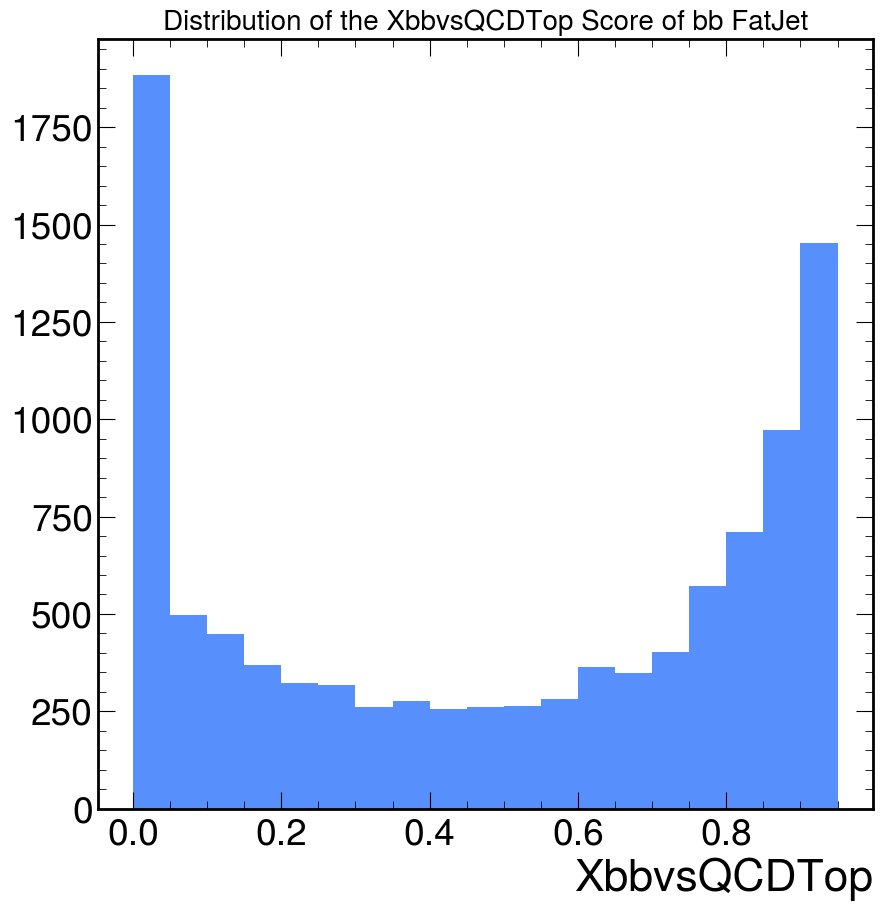

In [51]:
plt.hist(
    taggers_dict["bbtthh"]["XbbvsQCDTop"][bbtt_masks["bbtthh"]["bb"]], bins=np.arange(0, 1, 0.05)
)
plt.xlabel("XbbvsQCDTop")
plt.title("Distribution of the XbbvsQCDTop Score of bb FatJet", size=20)

In [55]:
bin_counts, bins = np.histogram(
    taggers_dict["bbtthh"]["XbbvsQCDTop"][bbtt_masks["bbtthh"]["bb"]], bins=np.arange(0, 1, 0.05)
)
bin_counts[0] / np.sum(bin_counts)

0.18363565437877902

In [23]:
def get_jet_vals(vals, mask):
    # check if vals is a numpy array
    if not isinstance(vals, np.ndarray):
        vals = vals.to_numpy()

    return vals[mask]

In [24]:
list(bgs.keys()) + ["combined"]

['qcd', 'ttbarhad', 'ttbarsl', 'ttbarll', 'dyjets', 'combined']

In [25]:
from sklearn.metrics import roc_curve

rocs = {}

for jet in ["bb", "tt"]:
    print(jet)
    rocs[jet] = {}
    for SIG_KEY in sigs.keys():
        print("\t" + SIG_KEY)
        rocs[jet][SIG_KEY] = {}
        for BG_KEY in [*bgs.keys(), "combined"]:
            print("\t\t" + BG_KEY)
            rocs[jet][SIG_KEY][BG_KEY] = {}
            for i, disc in enumerate(
                ["XbbvsQCD", "XbbvsQCDTop", f"{taukey}vsQCD", f"{taukey}vsQCDTop", "PNetXbbvsQCD"]
            ):
                print("\t\t\t" + disc)
                if BG_KEY != "combined":
                    bg_scores = get_jet_vals(taggers_dict[BG_KEY][disc], bbtt_masks[BG_KEY][jet])
                    bg_weights = events_dict[BG_KEY]["finalWeight"]
                else:
                    bg_scores = np.concatenate(
                        [
                            get_jet_vals(taggers_dict[key][disc], bbtt_masks[key][jet])
                            for key in bgs.keys()
                        ]
                    )
                    bg_weights = np.concatenate(
                        [events_dict[key]["finalWeight"] for key in bgs.keys()]
                    )

                sig_scores = get_jet_vals(taggers_dict[SIG_KEY][disc], bbtt_masks[SIG_KEY][jet])
                sig_weights = events_dict[SIG_KEY]["finalWeight"]

                fpr, tpr, thresholds = roc_curve(
                    np.concatenate([np.zeros_like(bg_scores), np.ones_like(sig_scores)]),
                    np.concatenate([bg_scores, sig_scores]),
                    sample_weight=np.concatenate([bg_weights, sig_weights]),
                )

                rocs[jet][SIG_KEY][BG_KEY][disc] = {
                    "fpr": fpr,
                    "tpr": tpr,
                    "thresholds": thresholds,
                    "label": disc,
                    "color": plt.cm.tab10.colors[i],
                }

bb
	bbtthh
		qcd
			XbbvsQCD
			XbbvsQCDTop
			XtauhtauhvsQCD
			XtauhtauhvsQCDTop
			PNetXbbvsQCD
		ttbarhad
			XbbvsQCD
			XbbvsQCDTop
			XtauhtauhvsQCD
			XtauhtauhvsQCDTop
			PNetXbbvsQCD
		ttbarsl
			XbbvsQCD
			XbbvsQCDTop
			XtauhtauhvsQCD
			XtauhtauhvsQCDTop
			PNetXbbvsQCD
		ttbarll
			XbbvsQCD
			XbbvsQCDTop
			XtauhtauhvsQCD
			XtauhtauhvsQCDTop
			PNetXbbvsQCD
		dyjets
			XbbvsQCD
			XbbvsQCDTop
			XtauhtauhvsQCD
			XtauhtauhvsQCDTop
			PNetXbbvsQCD
		combined
			XbbvsQCD
			XbbvsQCDTop
			XtauhtauhvsQCD
			XtauhtauhvsQCDTop
			PNetXbbvsQCD
	vbfbbtt-k2v0hh
		qcd
			XbbvsQCD
			XbbvsQCDTop
			XtauhtauhvsQCD
			XtauhtauhvsQCDTop
			PNetXbbvsQCD
		ttbarhad
			XbbvsQCD
			XbbvsQCDTop
			XtauhtauhvsQCD
			XtauhtauhvsQCDTop
			PNetXbbvsQCD
		ttbarsl
			XbbvsQCD
			XbbvsQCDTop
			XtauhtauhvsQCD
			XtauhtauhvsQCDTop
			PNetXbbvsQCD
		ttbarll
			XbbvsQCD
			XbbvsQCDTop
			XtauhtauhvsQCD
			XtauhtauhvsQCDTop
			PNetXbbvsQCD
		dyjets
			XbbvsQCD
			XbbvsQCDTop
			XtauhtauhvsQCD
			Xt

In [26]:
for sig_raw in sigs.keys():
    if "vbf" in sig_raw:
        sig = "VBF"
    else:
        sig = "ggF"
    print("\t", sig)
    for bg in list(bgs.keys()) + ["combined"]:
        print("\t\t", bg)
        for jet, title in zip(
            ["bb", "tt"], ["bb FatJet", rf"$\tau_h\tau_{{{CHANNEL.key}}}$ FatJet"]
        ):
            plotting.multiROCCurveGrey(
                {"": rocs[jet][sig_raw][bg]},
                title=f"{year} {sig} {title} vs. {bg} Background",
                show=False,
                plot_dir=plot_dir,
                name=f"roc_{jet}_jet_{sig}_vs_{bg}",
            )

	 ggF
		 qcd
		 ttbarhad
		 ttbarsl
		 ttbarll
		 dyjets
		 combined
	 VBF
		 qcd
		 ttbarhad
		 ttbarsl
		 ttbarll
		 dyjets
		 combined


In [39]:
new_rocs = {}
jet = "bb"
for sig_raw in ["bbtthh"]:
    new_roc_sig = {}
    for bg in list(bgs.keys()) + ["combined"]:
        roc_tmp = rocs[jet][sig_raw][bg]["XbbvsQCDTop"]
        roc_tmp["label"] = bg
        new_roc_sig[bg] = roc_tmp
    new_rocs[sig_raw] = new_roc_sig

In [ ]:
roc_sel = {}
roc_sel["bbtt"] = rocs["bb"]["bbtthh"]

In [35]:
new_rocs["bbtthh"]["combined"]["label"]

'XbbvsQCDTop'

0
1
2
3
4
5


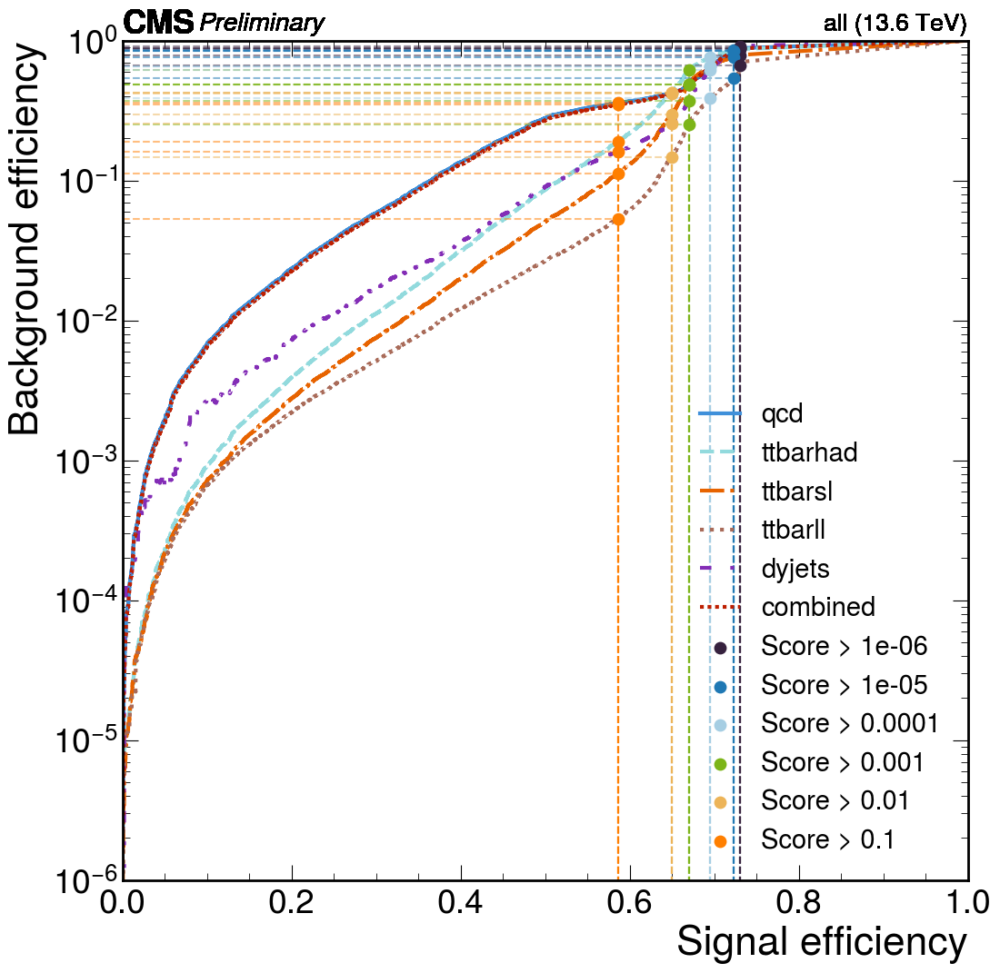

In [45]:
plotting.multiROCCurve(
    new_rocs,  # [bg]['XbbvsQCDTop'],
    thresholds=[1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1],
    show=True,
    log=True,
)

In [37]:
rocs[jet][sig_raw][bg]

{'XbbvsQCD': {'fpr': array([0.00000000e+00, 1.82899364e-09, 1.82899364e-09, ...,
         9.96290827e-01, 9.96290830e-01, 1.00000000e+00]),
  'tpr': array([0.00000000e+00, 0.00000000e+00, 1.15309517e-05, ...,
         9.94327079e-01, 9.94327079e-01, 1.00000000e+00]),
  'thresholds': array([            inf,  9.99971155e-01,  9.99939372e-01, ...,
          1.05697587e-11,  4.02647453e-13, -9.99990000e+04]),
  'label': 'XbbvsQCD',
  'color': (0.12156862745098039, 0.4666666666666667, 0.7058823529411765)},
 'XbbvsQCDTop': {'fpr': array([0.00000000e+00, 1.86559599e-09, 3.83961479e-09, ...,
         9.96290827e-01, 9.96290830e-01, 1.00000000e+00]),
  'tpr': array([0.        , 0.        , 0.        , ..., 0.99432708, 0.99432708,
         1.        ]),
  'thresholds': array([            inf,  9.99894767e-01,  9.99892378e-01, ...,
          7.75561921e-16,  3.66733237e-16, -9.99990000e+04]),
  'label': 'XbbvsQCDTop',
  'color': (1.0, 0.4980392156862745, 0.054901960784313725)},
 'XtauhtauhvsQCD':

In [57]:
def make_vector(events: pd.DataFrame, obj: str):
    """Create a ``vector`` object from the columns of the dataframe"""
    mstring = "Msd" if obj == "ak8FatJet" else "Mass"

    return vector.array(
        {
            "pt": events[f"{obj}Pt"],
            "phi": events[f"{obj}Phi"],
            "eta": events[f"{obj}Eta"],
            "M": events[f"{obj}{mstring}"],
        }
    )

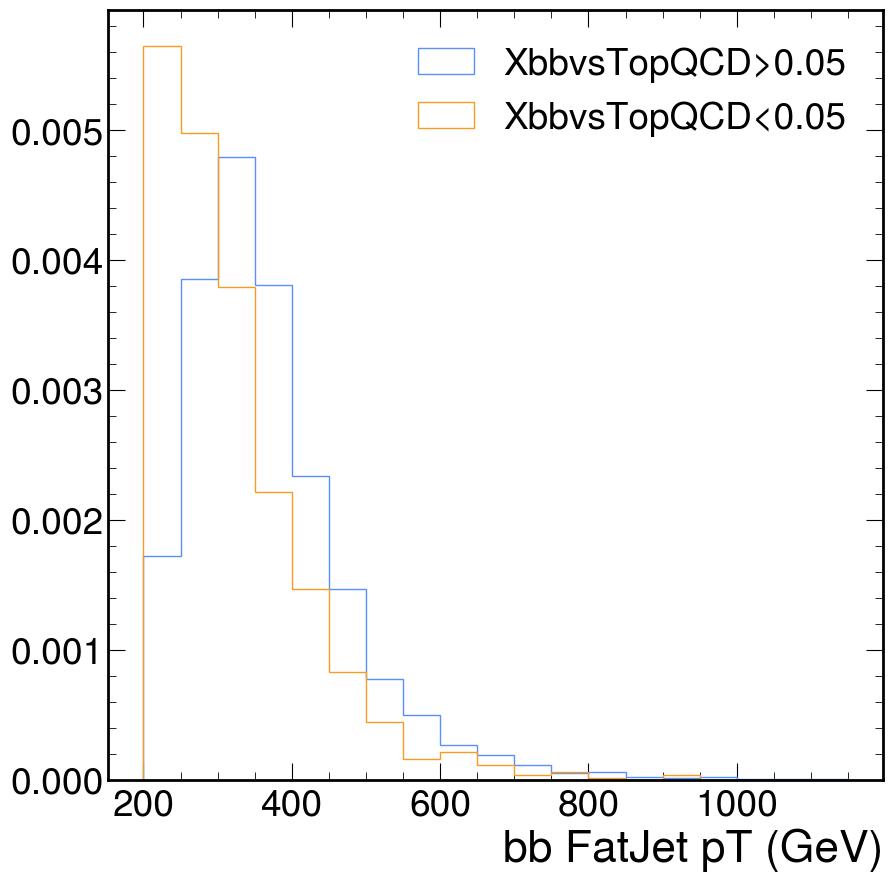

In [82]:
fjs = make_vector(events_dict["bbtthh"], "ak8FatJet")
sel_bb = bbtt_masks["bbtthh"]["bb"]
sel_real_fj = taggers_dict["bbtthh"]["XbbvsQCDTop"] > 0
sel_score_low = taggers_dict["bbtthh"]["XbbvsQCDTop"] < 0.05

sel_low_score_bb = sel_bb & sel_score_low & sel_real_fj
sel_high_score_bb = sel_bb & ~sel_score_low & sel_real_fj
fjs_low_score = fjs[sel_low_score_bb]
fjs_high_score = fjs[sel_high_score_bb]

plt.hist(
    fjs_high_score.pt,
    bins=np.arange(200, 1200, 50),
    label="XbbvsTopQCD>0.05",
    density=True,
    histtype="step",
)
plt.hist(
    fjs_low_score.pt,
    bins=np.arange(200, 1200, 50),
    label="XbbvsTopQCD<0.05",
    density=True,
    histtype="step",
)
plt.xlabel("bb FatJet pT (GeV)")
plt.legend()

Text(1, 0, 'XbbvsQCDTop')

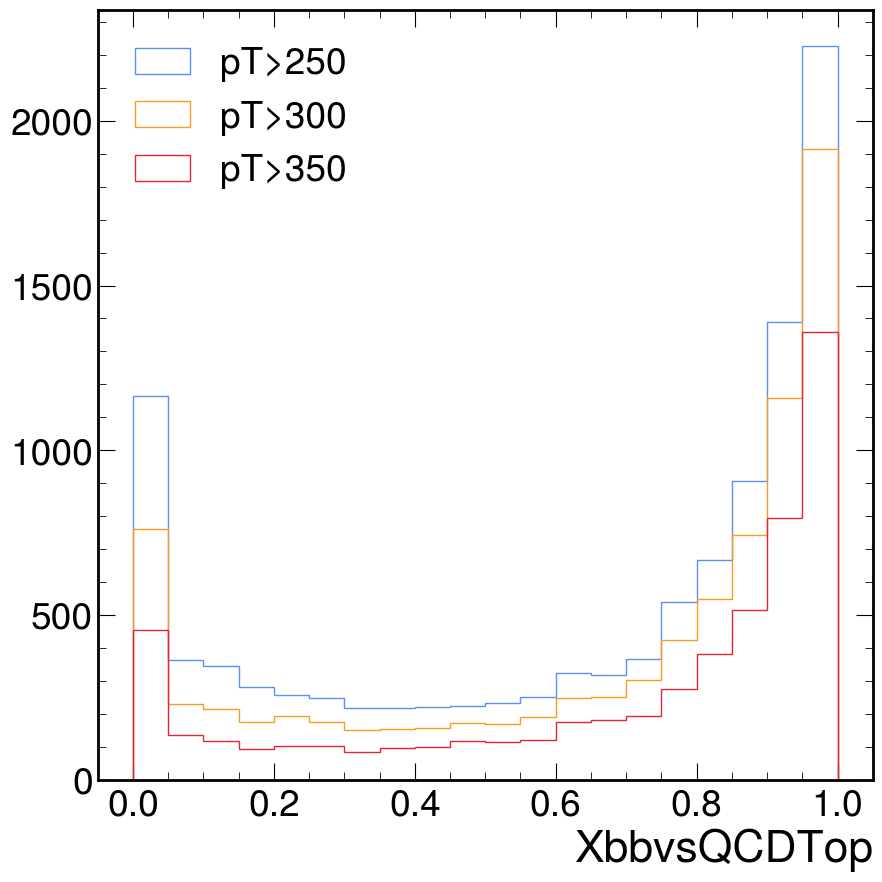

In [85]:
pt_cut_0 = fjs.pt > 250
pt_cut_1 = fjs.pt > 300
pt_cut_2 = fjs.pt > 350

sel_bb = bbtt_masks["bbtthh"]["bb"]

sel0 = sel_bb & pt_cut_0
sel1 = sel_bb & pt_cut_1
sel2 = sel_bb & pt_cut_2

plt.hist(
    taggers_dict["bbtthh"]["XbbvsQCDTop"][sel0],
    bins=np.arange(0, 1.05, 0.05),
    histtype="step",
    label="pT>250",
)
plt.hist(
    taggers_dict["bbtthh"]["XbbvsQCDTop"][sel1],
    bins=np.arange(0, 1.05, 0.05),
    histtype="step",
    label="pT>300",
)
plt.hist(
    taggers_dict["bbtthh"]["XbbvsQCDTop"][sel2],
    bins=np.arange(0, 1.05, 0.05),
    histtype="step",
    label="pT>350",
)

plt.legend()
plt.xlabel("XbbvsQCDTop")